# A Fine-Tuned Supervised Extra Tree Model for Credit Card Fraud Detection

# 1. Import the essential libraries and dataset


In [1]:
# import basic libraries
import numpy as np
import pandas as pd

# import plot libraries
import matplotlib.pyplot as plt
import seaborn as sns

# dataset split for train and test set
from sklearn.model_selection import train_test_split

# import imblearn library for resampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

# model related libraries
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from imblearn import FunctionSampler
from imblearn.pipeline import Pipeline

# Assessment metrics
from sklearn.metrics import (
    classification_report,
    ConfusionMatrixDisplay,
    average_precision_score,
    precision_recall_curve,
    PrecisionRecallDisplay,
)

# several config
%config InlineBackend.figure_format = 'png'
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# read target dataset into pandas dataframe
df = pd.read_csv('project/dataset/creditcard.csv')

# 2 Dataset exploration

## 2.1 Statistical analysis

In [3]:
df.shape

(284807, 31)

In [4]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

### Checking the percentage of fraud and non-fraud transaction

In [7]:
# define a unction that shows percentage of fraud and normal transactions
def perc(dataset):
    perc = round(dataset.Class.value_counts() / len(dataset) * 100, ndigits=3)
    perc_np = perc.to_numpy()
    
    print('The percentage of transactions:')
    print(f' Fraud:  {perc_np[1]}%')
    print(f'Normal: {perc_np[0]}%')
    print()
    print(f'The dataset have {dataset.Class.value_counts()[1]} fraud transactions.')
    print(f'The dataset have {dataset.Class.value_counts()[0]} normal transactions.')

perc(df)

The percentage of transactions:
 Fraud:  0.173%
Normal: 99.827%

The dataset have 492 fraud transactions.
The dataset have 284315 normal transactions.


### Pie chart for percentage visualization

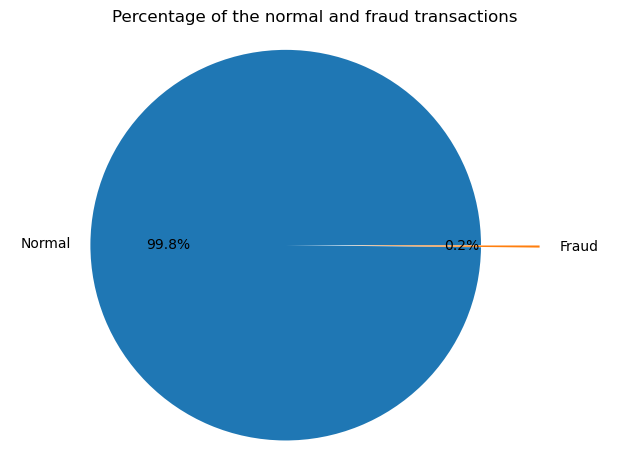

In [8]:
counts = df.copy().Class.value_counts()
lab = ['Normal', 'Fraud']
exp = [0.1, 0.2]

plt.pie(counts, labels=lab, explode=exp, autopct='%1.1f%%')

plt.title('Percentage of the normal and fraud transactions')
plt.tight_layout()
plt.axis('equal')

plt.show()

## 2.2 Data visualization
In this session, few pictures will be generated to present the dataset. The relationship between features in this dataset will be shown. Several techniques used in data visualization will be listed below,
1. Correlation analysis
    1. **correlation coefficient** matrix
    2. **scatter plot** (using pairplot from Seaborn)

In [9]:
# # distribution of each feature by using histogram
# hist = df[[
#     'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8',
#     'V9', 'V10', 'V11', 'V12', 'V13', 'V14'
# ]].hist(bins=50, figsize=(20, 15))

# plt.subplots_adjust(top=.95)
# plt.suptitle('Distribution of each numerical feature')

# plt.show()

In [10]:
# # distribution of each feature by using histogram
# hist = df[[
#     'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
#     'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28'
# ]].hist(bins=50, figsize=(20, 15))

# plt.subplots_adjust(top=.95)
# plt.suptitle('Distribution of each numerical feature')

# plt.show()

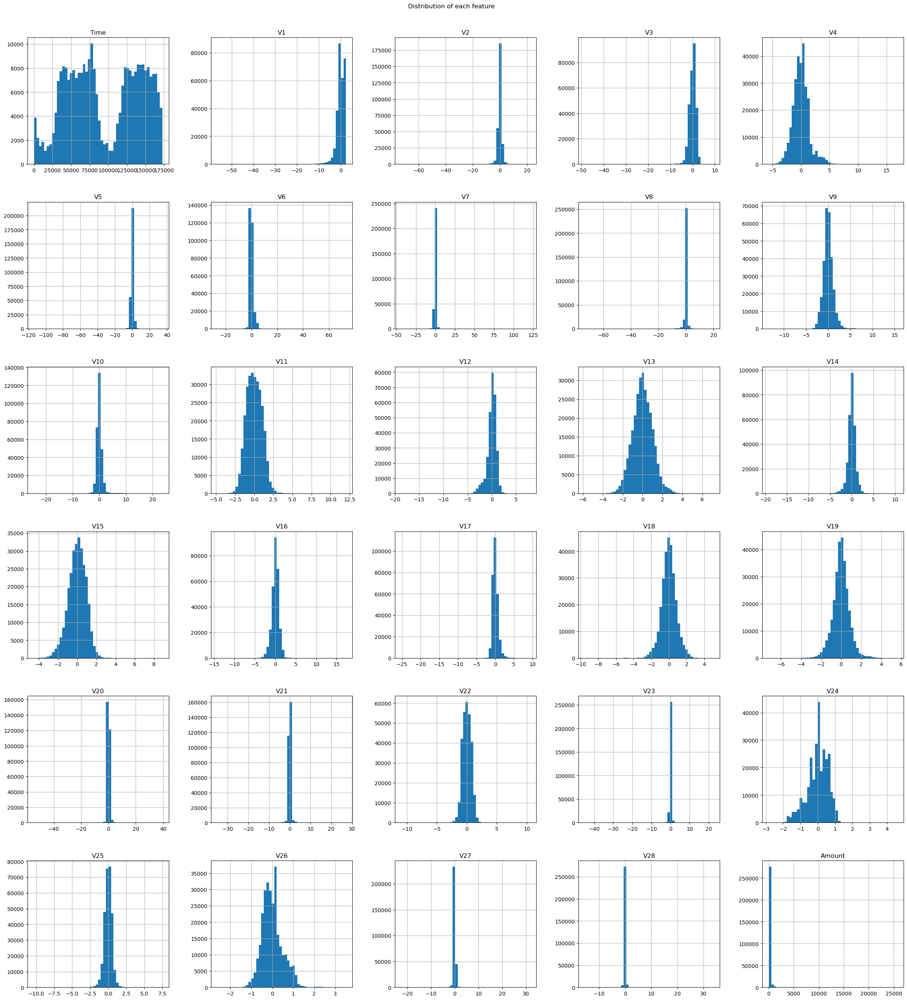

In [11]:
# distribution of each feature by using histogram
hist = df.drop('Class', axis=1).hist(bins=50, figsize=(30, 30))

plt.subplots_adjust(top=.95)
plt.suptitle('Distribution of each feature')

plt.show()

### 2.2.1 Correlation analysis

1. Dropping time and amount columns since they are not correlated with fraud transactions
2. Other columns could be dropped further based on correlation score
3. Make separated dataframes for each of them
4. Inspect the result

In [12]:
# # compute the correlation matrix between features
# correlation_matrix = df.drop(['Time', 'Amount', 'Class'], axis=1).corr()

# # set the figure size
# plt.figure(figsize=(30, 15))

# # plot the correlation matrix as a heatmap
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# plt.title('Correlation Coefficient Matrix', y=1.01)
# plt.tight_layout()

# # Display the plot
# plt.show()

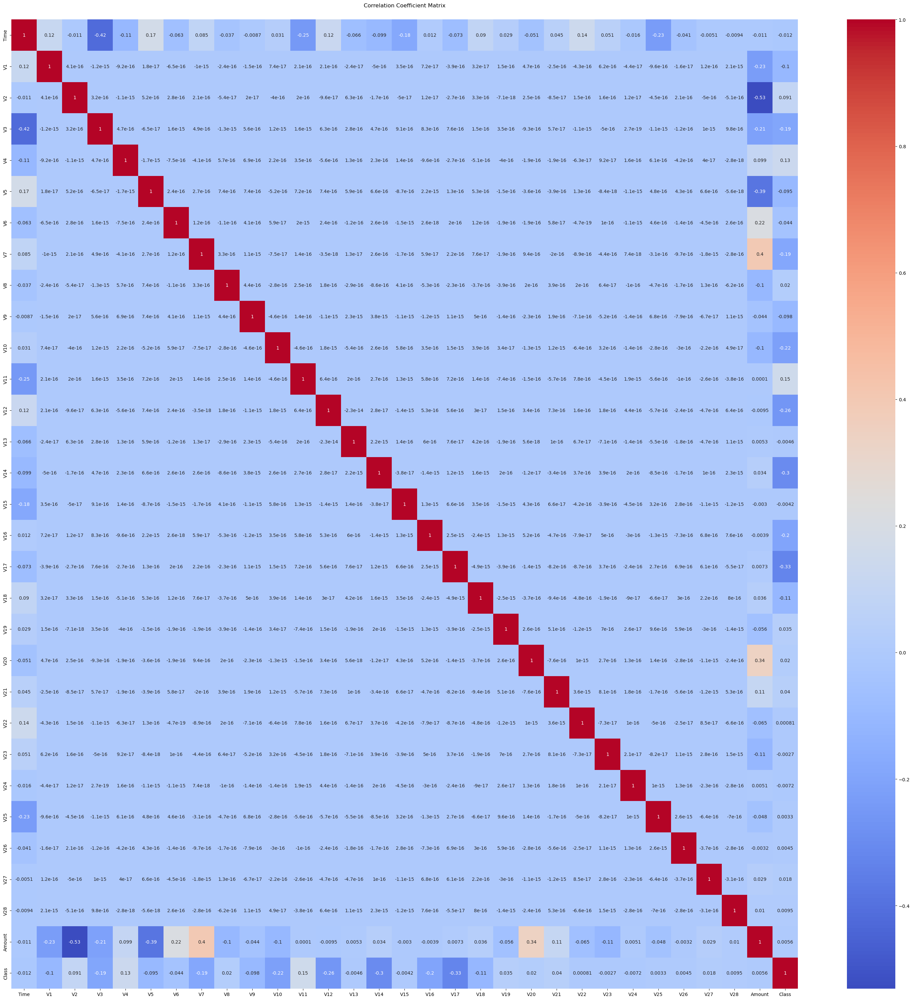

In [111]:
# compute the correlation matrix between features
correlation_matrix = df.corr()

# set the figure size
plt.figure(figsize=(30,30))

# plot the correlation matrix as a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.title('Correlation Coefficient Matrix', y=1.01)
plt.tight_layout()

# Display the plot
plt.show()

### Feature selection based on correlation coefficient score

In [14]:
# define a function to calculate correlation between nemerical features and the Class feature
# set threshold to 0.12 and select the features which have higher socore than threshold
def corr_list(dataset):
    
    # correlations between nemerical features and the Class feature
    corr = dataset.corr()['Class'].to_dict()
    output_dict = {}
    
    for key, value in corr.items():
        if abs(value) > 0.12:
            output_dict[key] = round(value, 3)
    
    return output_dict

In [ ]:
def corr_list(dataset):
    
    # correlations between nemerical features and the Class feature
    corr = dataset.corr()['Class'].to_dict()
    output_dict = {}
    
    for key, value in corr.items():
        if abs(value) > 0.12:
            output_dict[key] = round(value, 3)
    
    return output_dict

In [15]:
fea_corr = corr_list(df)
fea_corr

{'V3': -0.193,
 'V4': 0.133,
 'V7': -0.187,
 'V10': -0.217,
 'V11': 0.155,
 'V12': -0.261,
 'V14': -0.303,
 'V16': -0.197,
 'V17': -0.326,
 'Class': 1.0}

### Dataset transformation and manipulation

In [16]:
# define a function for feature selection
def keep_col(dataset, columns=None):
    
    df_keep = dataset.copy()
    
    if columns is not None:
        df_keep = df_keep[columns]

    return df_keep

In [17]:
# make new datasets forfuther data visualization, data split, and data manipulation
# df_obvious_feats is used for comparison of 'Time' and 'Amount'
# df_hidden_feats is used for comparison of all numerical features
df_obvious_feats = keep_col(df, columns=['Time', 'Amount', 'Class'])
df_v_feats = keep_col(df.drop(['Time', 'Amount'], axis=1))

# # save dataset for further testing
# df_v_feats.to_csv('project/981B/df_v_feats.csv', index=False)

In [18]:
df_v_feats.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


In [19]:
df_v_feats.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

### 2.2.2 Data visualization after correlation analysis (!!review from there!!!!)
In this section, related features from dataset will be presented in the Seaborn pair plot.

Based on the correlation coefficient matrix, the features will be split into 3 groups,
1. Time and Amount columns
2. Features of with high correlation
3. Features of with low correlation

In [20]:
# plot relationship between each selected features
# dataset is a dataframe, and features is a list of column name(str)
def pair_sca(dataset, features=None, suf=''):
    
    # sort the dataset in case to plot fraud transactions last.
    # switch 'Class' value from 0 and 1 to 'Normal' and 'Fraud' respectively
    trans_dataset = dataset.sort_values('Class').replace({'Class': {0: 'normal', 1: 'fraud'}})
    
    g = sns.pairplot(data=trans_dataset, vars=features, hue='Class',
                     plot_kws={'alpha':0.5}, corner=True).fig

    g.suptitle(f"Relationship between each selected numerical feature{suf}")
    g.subplots_adjust(top=.95)
    plt.show()

# plot relationship between two specific features
# dataset is a pandas dataframe, and col_1, col_2 are the specific column name(str)
def single_sca(dataset, col_1, col_2, suf=''):
    
    # sort the dataset in case to plot fraud transactions last.
    # switch 'Class' value from 0 and 1 to 'Normal' and 'Fraud' respectively
    trans_dataset = dataset.sort_values('Class').replace({'Class': {0: 'Normal', 1: 'Fraud'}})
    
    g = sns.jointplot(data=trans_dataset, x=col_1, y=col_2, hue='Class',
                      joint_kws={'alpha':0.6}, height=5).fig
    
    g.suptitle(f"Relationship between {col_1} and {col_2}{suf}")
    g.subplots_adjust(top=.9)
    plt.show()

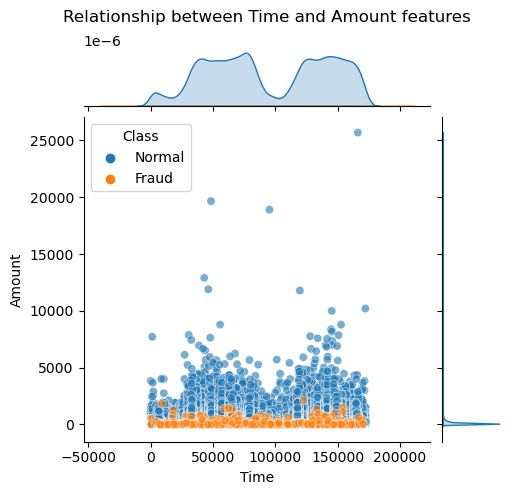

In [21]:
# data visualization about the relationship between 'Time' and 'Amount'
single_sca(df_obvious_feats, 'Time', 'Amount', suf=' features')

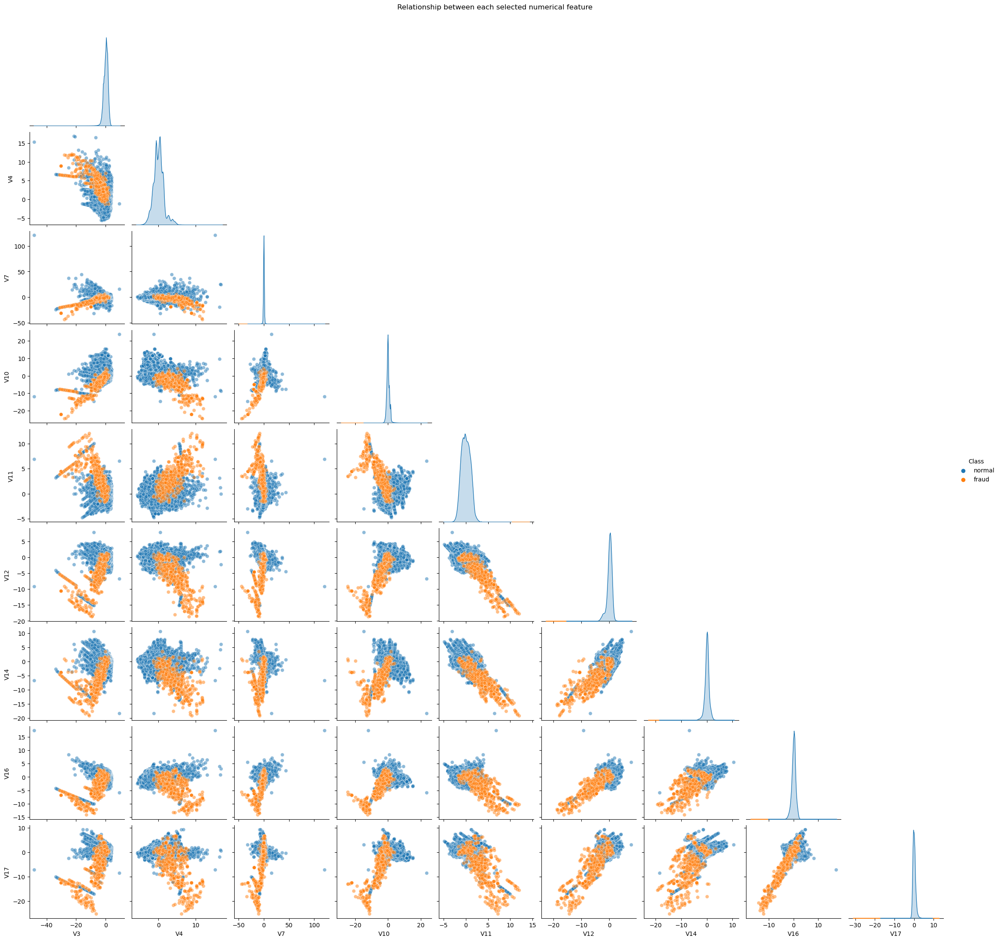

CPU times: total: 6min 52s
Wall time: 6min 27s


In [22]:
%%time
# data visualization about the relationship between each features that have strong correlation
pair_sca(df_v_feats, ['V3', 'V4', 'V7', 'V10', 'V11', 'V12', 'V14', 'V16', 'V17'])

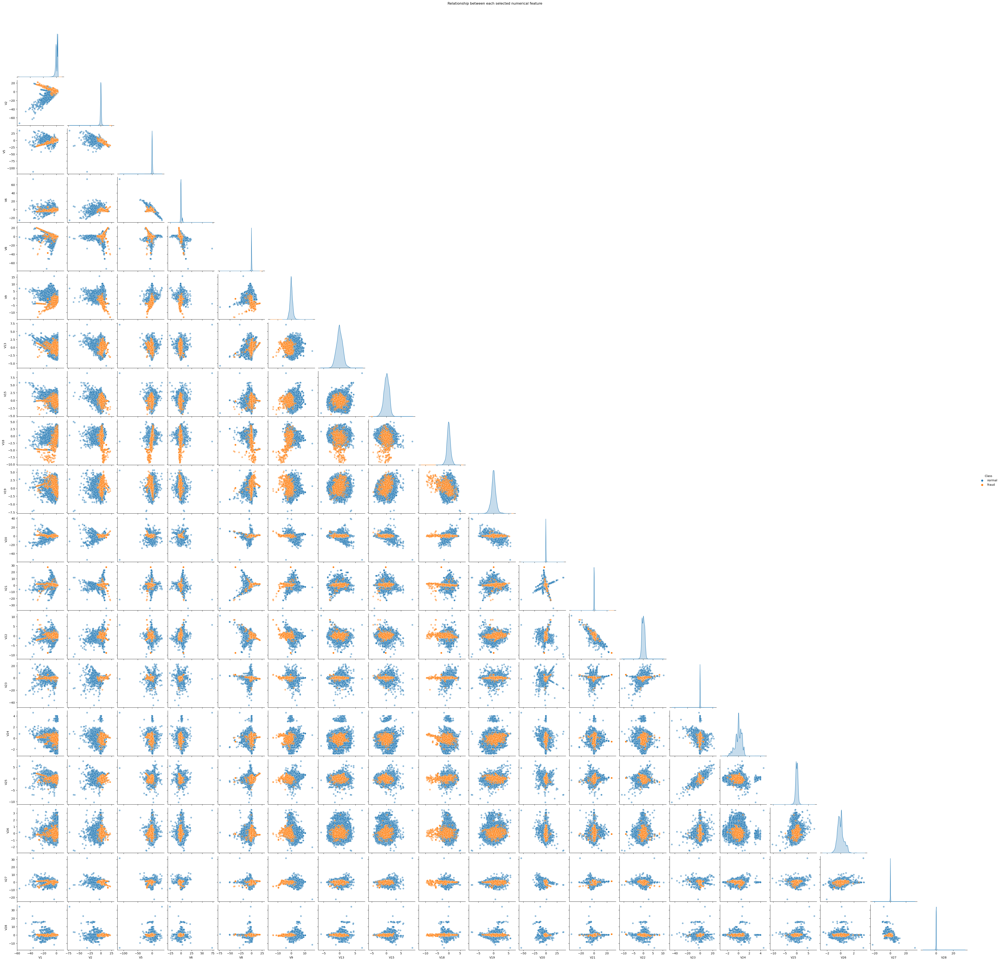

CPU times: total: 30min 31s
Wall time: 29min 38s


In [23]:
%%time
# data visualization about the relationship between each features that have weak correlation
pair_sca(df_v_feats, ['V1', 'V2', 'V5', 'V6', 'V8', 'V9', 'V13', 'V15', 'V18', 'V19',
                      'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28'])

In [24]:
# make a new dataset after correlation coeffcient analysis
# df_corr_feats used for futhre data visualization, data split, and data manipulation
df_corr_feats = keep_col(df_v_feats, columns=['V3', 'V4', 'V7', 'V10', 'V14', 'V17', 'Class'])

# # save dataset for further testing
# df_corr_feats.to_csv('project/981B/df_corr_feats.csv', index=False)

In [25]:
df_corr_feats.head()

,V3,V4,V7,V10,V14,V17,Class
0,2.536347,1.378155,0.239599,0.090794,-0.311169,0.207971,0
1,0.166480,0.448154,-0.078803,-0.166974,-0.143772,-0.114805,0
2,1.773209,0.379780,0.791461,0.207643,-0.165946,1.109969,0
3,1.792993,-0.863291,0.237609,-0.054952,-0.287924,-0.684093,0
4,1.548718,0.403034,0.592941,0.753074,-1.119670,-0.237033,0


In [26]:
df_corr_feats.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

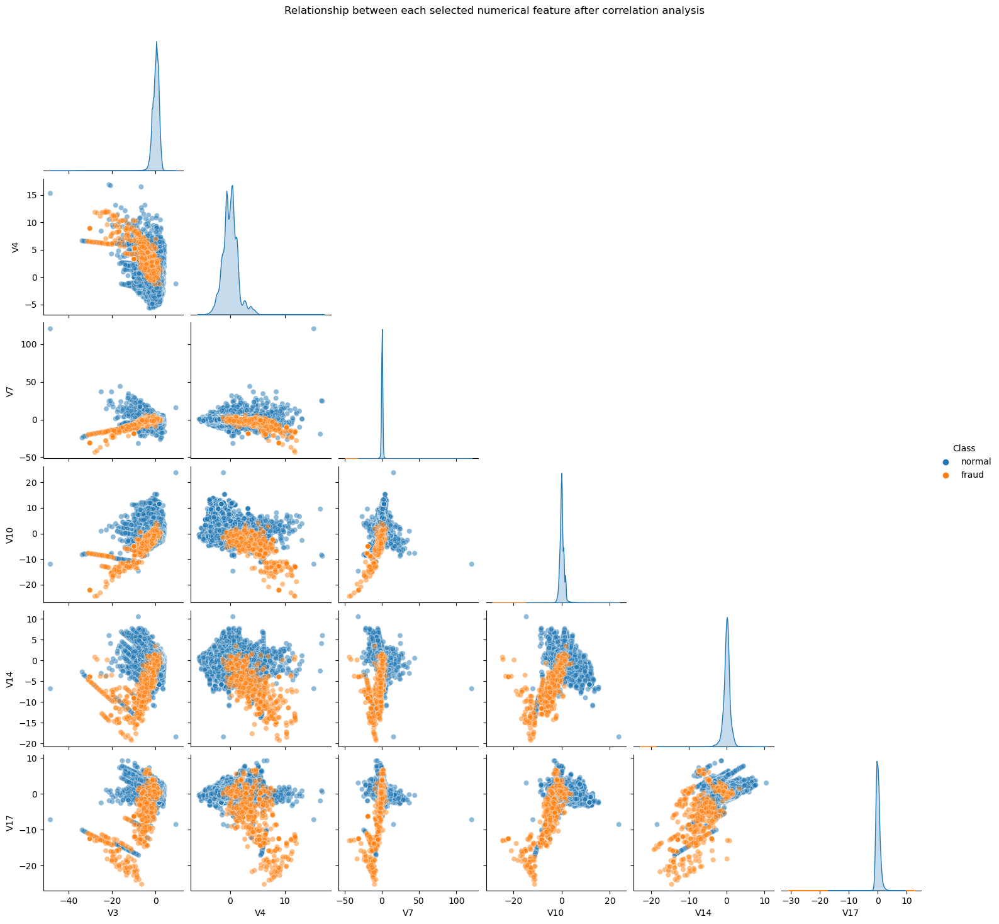

CPU times: total: 3min 4s
Wall time: 2min 47s


In [27]:
%%time
pair_sca(df_corr_feats, suf=' after correlation analysis')

## 2.3 Dataset preparation -- train test split

In [28]:
# customed train test split function
def data_split(dataset, sp_size=0.2):
     
    #columns should be a list or single str
    input = dataset.drop('Class', axis=1)
    target = dataset.Class
    X_train, X_test, y_train, y_test = train_test_split(input, target, test_size=sp_size,
                                                    random_state=1, stratify=target)
    
    return X_train, X_test, y_train, y_test

In [29]:
X_train_v, X_test_v, y_train_v, y_test_v = data_split(df_v_feats)
X_train_corr, X_test_corr, y_train_corr, y_test_corr = data_split(df_corr_feats)

### Check the split dataset

In [30]:
X_train_v.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
9341,1.148607,-0.004154,-0.231106,1.124256,0.696077,1.177523,-0.160142,0.201478,1.568269,-0.320290,...,0.360271,-0.122816,-0.294334,-0.550620,-0.309693,-1.773489,0.791006,-0.263954,-0.008489,-0.011284
210529,-0.910538,-0.971254,1.033829,-1.514111,-1.068542,0.148626,-0.660712,0.694582,-0.563151,-0.396853,...,1.073261,0.362532,0.183422,0.082033,0.245169,-0.347895,-0.046626,-0.366928,-0.130325,-0.161839
51525,1.222501,0.491904,-0.082522,0.987913,0.164676,-0.845453,0.515114,-0.258261,-0.667442,0.186485,...,0.029591,-0.076698,0.068123,0.244725,-0.173798,0.373883,0.849200,-0.317268,-0.007417,0.003691
128333,1.184303,-0.066290,0.400333,-0.048278,-0.447460,-0.521259,-0.103204,-0.044640,-0.032670,-0.048690,...,0.486907,0.041195,-0.268415,-0.900138,0.112504,0.032476,0.046804,0.472132,-0.068010,0.008341
252025,-0.484059,0.439377,-2.033102,-3.398765,2.209264,3.175789,-0.566306,0.423994,-1.281704,0.137172,...,-0.509811,-0.171988,1.344784,1.271853,0.055813,0.735276,-0.629507,-0.178298,0.394319,0.240147


In [31]:
X_train_v.shape

(227845, 28)

In [32]:
y_train_v.value_counts()

0    227451
1       394
Name: Class, dtype: int64

In [33]:
y_test_v.value_counts()

0    56864
1       98
Name: Class, dtype: int64

In [34]:
X_train_corr.head()

,V3,V4,V7,V10,V14,V17
9341,-0.231106,1.124256,-0.160142,-0.320290,1.788162,0.170873
210529,1.033829,-1.514111,-0.660712,-0.396853,-0.561552,0.210419
51525,-0.082522,0.987913,0.515114,0.186485,0.593085,-0.612390
128333,0.400333,-0.048278,-0.103204,-0.048690,0.334798,-0.747442
252025,-2.033102,-3.398765,-0.566306,0.137172,0.442717,-0.073262


In [35]:
X_train_corr.shape

(227845, 6)

In [36]:
y_train_corr.value_counts()

0    227451
1       394
Name: Class, dtype: int64

In [37]:
y_test_corr.value_counts()

0    56864
1       98
Name: Class, dtype: int64

## 2.4. Dataset resampling
1. Pandas undersampling 1:10 (fraud: normal)
2. Oversampling
2. Undersampling

In [38]:
# weighted resampling function for data visualization by using pandas
# input is X_train set, target is y_train set
# fraud transactions account for 10% of total resampled dataset
def res_weighted(input, target):
    
    # concatenate input and target into a new dataframe
    df_ = pd.concat([input, target], axis=1)
    
    # split normal and fraud transactions
    normal = df_.query('Class==0')
    fraud = df_.query('Class==1')
    
    # concatenate resampled normal transactions with fraud transactions
    normal_res = normal.sample(n=(len(fraud) * 9), random_state=1)
    df_res = pd.concat([normal_res, fraud])
    
    return df_res

In [39]:
# over and under resampling function for data visualization by using imblearn
# input is X_train set, target is y_train set
# method is either oversampling or undersampling
# normal and fraud transactions both account for 50% of total resampled dataset
def resample(input, target, method):
    
    # choose resampling method
    if method == 'oversample':
        model = SMOTE(random_state=1)
    elif method == 'undersample':
        model = RandomUnderSampler(random_state=1)
    else:
        raise ValueError("Method must be provided!")
    
    # resampling input and target and return a pandas dataframe
    X_res, y_res = model.fit_resample(input, target)
    X_res['Class'] = y_res
    
    return X_res

### Weighted sampling

In [40]:
df_w = res_weighted(X_train_corr, y_train_corr)

In [41]:
df_w.head()

,V3,V4,V7,V10,V14,V17,Class
200885,1.870001,-3.215858,-0.003371,-1.972292,-0.599401,-0.984886,0
168773,-0.451852,-0.796593,1.488813,-0.498832,0.857930,-0.335348,0
234668,-1.666090,0.456784,0.517232,-0.421143,0.164872,-0.104433,0
105882,2.122859,1.676907,-0.533538,-0.299473,-0.065641,0.948603,0
243972,-0.274683,-3.795781,1.281695,-2.687676,1.095618,-0.487153,0


In [42]:
df_w.Class.value_counts()

0    3546
1     394
Name: Class, dtype: int64

In [43]:
len(df_w)

3940

### Undersampling

In [44]:
df_under = resample(X_train_corr, y_train_corr, 'undersample')

In [45]:
df_under.head()

,V3,V4,V7,V10,V14,V17,Class
0,1.870001,-3.215858,-0.003371,-1.972292,-0.599401,-0.984886,0
1,-0.451852,-0.796593,1.488813,-0.498832,0.857930,-0.335348,0
2,-1.666090,0.456784,0.517232,-0.421143,0.164872,-0.104433,0
3,2.122859,1.676907,-0.533538,-0.299473,-0.065641,0.948603,0
4,-0.274683,-3.795781,1.281695,-2.687676,1.095618,-0.487153,0


In [46]:
df_under.Class.value_counts()

0    394
1    394
Name: Class, dtype: int64

In [47]:
len(df_under)

788

### Oversampling


In [48]:
df_over = resample(X_train_corr, y_train_corr, 'oversample')

In [49]:
df_over.head()

,V3,V4,V7,V10,V14,V17,Class
0,-0.231106,1.124256,-0.160142,-0.320290,1.788162,0.170873,0
1,1.033829,-1.514111,-0.660712,-0.396853,-0.561552,0.210419,0
2,-0.082522,0.987913,0.515114,0.186485,0.593085,-0.612390,0
3,0.400333,-0.048278,-0.103204,-0.048690,0.334798,-0.747442,0
4,-2.033102,-3.398765,-0.566306,0.137172,0.442717,-0.073262,0


In [50]:
df_over.Class.value_counts()

0    227451
1    227451
Name: Class, dtype: int64

In [51]:
len(df_over)

454902

### Data visualization analysis after resampling

### Dataset before resampling

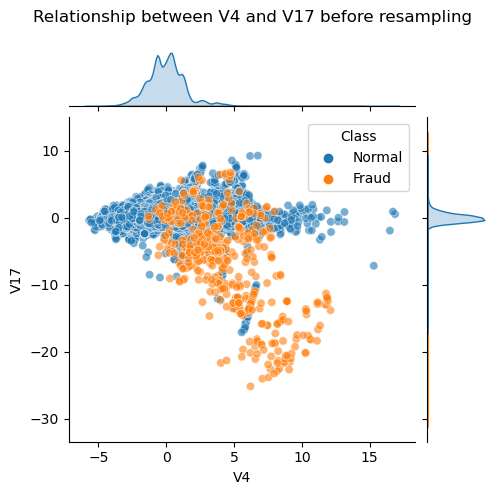

In [107]:
single_sca(df_corr_feats, 'V4', 'V17', ' before resampling')

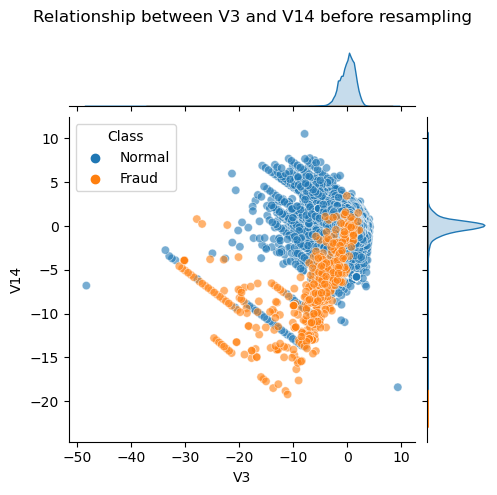

In [108]:
single_sca(df_corr_feats, 'V3', 'V14', ' before resampling')

### Weighted sampling

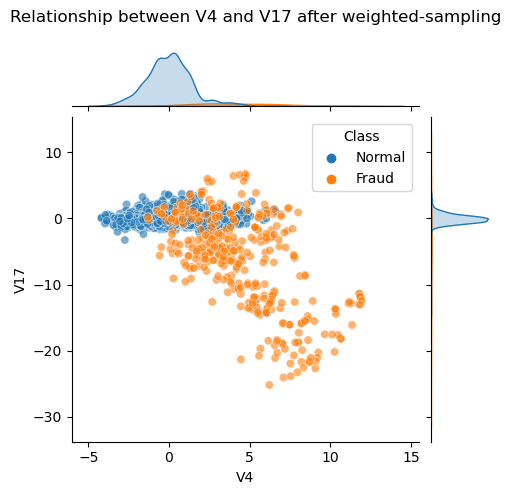

In [54]:
single_sca(df_w, 'V4', 'V17', ' after weighted-sampling')

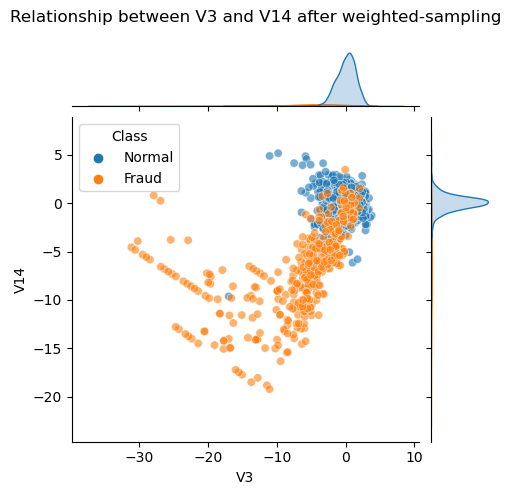

In [55]:
single_sca(df_w, 'V3', 'V14', ' after weighted-sampling')

### Under sampling

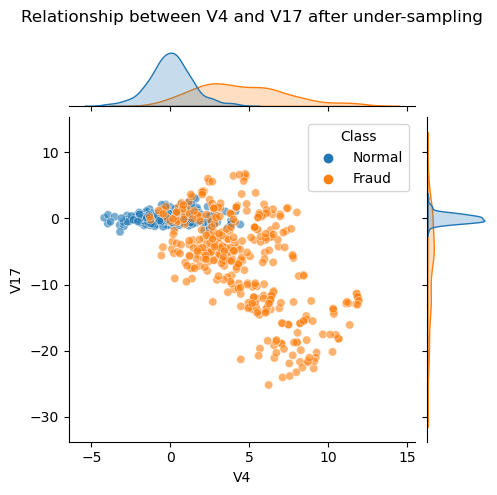

In [56]:
single_sca(df_under, 'V4', 'V17', ' after under-sampling')

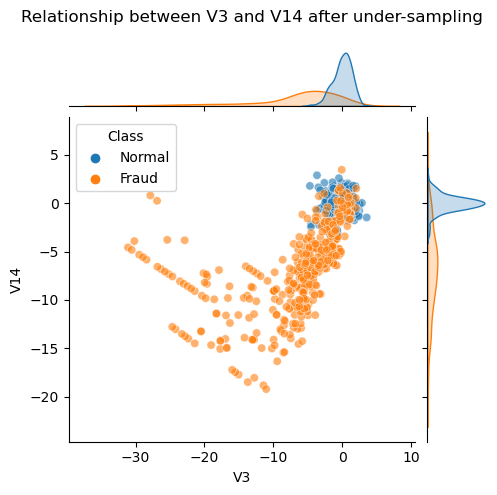

In [57]:
single_sca(df_under, 'V3', 'V14', ' after under-sampling')

### Over sampling

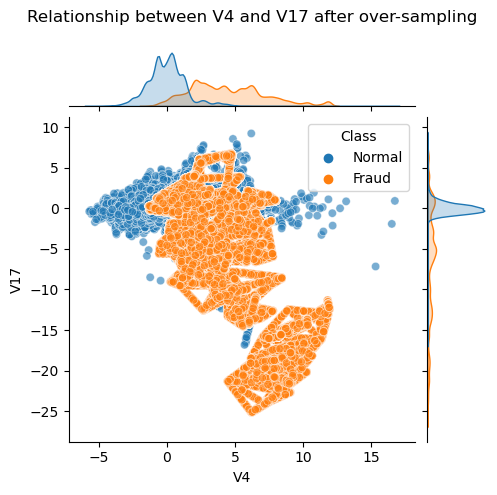

In [58]:
single_sca(df_over, 'V4', 'V17', ' after over-sampling')

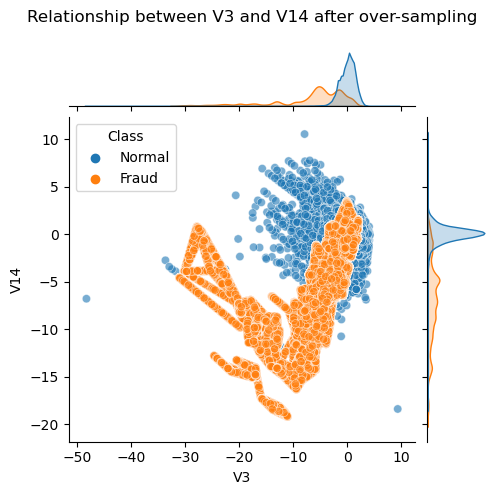

In [59]:
single_sca(df_over, 'V3', 'V14', ' after over-sampling')

## 2.5 Model selection and construction

### Building custom function for pipeline

In [60]:
# this function is used for building a pipeline through cross validation
# fraud transactions account for 10% of total transactions
# df_corr will be fit into this function
def res_weighted_pl(input, target):
    
    # input and target should be numpy array that defined by FunctionSampler
    array_ = np.concatenate((input, target.reshape(-1, 1)), axis=1)
    
    # transfer numpy array into pandas dataframe with column name
    df_ = pd.DataFrame(
        array_, columns=['V3', 'V4', 'V7', 'V10', 'V14', 'V17', 'Class']
    )
    
    # split normal and fraud transactions
    normal = df_.query('Class==0')
    fraud = df_.query('Class==1')
    
    # concatenate resampled normal transactions with fraud transactions
    normal_res = normal.sample(n=(len(fraud) * 9), random_state=1)
    df_res = pd.concat([normal_res, fraud])
    
    # input target split
    X_res = df_res.drop('Class', axis=1)
    y_res = df_res.Class
    
    return X_res, y_res

### Model comparison and selection by Pycaret

In [61]:
# code in colab, will be provided as a seperate code file

## 2.6 Pipeline construction

In [62]:
# making a function to create particular resampled pipeline
# model is the final classifier after hyperparameter tuning
def res_pl(method):
    
    # choose resampling method
    if method == 'weight':
        # custom sampler
        sampler = FunctionSampler(func=res_weighted_pl)    
    elif method == 'under':
        sampler = RandomUnderSampler(random_state=1)
    elif method == 'over':
        sampler = SMOTE(random_state=1)
    else:
        raise ValueError("Method must be provided!")

    # default classifier for further hyperparameter tuning
    clf = ExtraTreesClassifier(random_state=1)
    # make a pipeline for resamplers and classifiers
    pipeline = Pipeline([('Resampler', sampler), ('Classifier', clf)])
    
    return pipeline

In [63]:
# defalut classifier
clf_def = ExtraTreesClassifier(random_state=1)

# pipelines for hyperparameter tuning
pl_w = res_pl('weight')
pl_under = res_pl('under')
pl_over = res_pl('over')

In [64]:
pl_w

Pipeline(steps=[('Resampler',
                 FunctionSampler(func=<function res_weighted_pl at 0x0000022B7B8165C0>)),
                ('Classifier', ExtraTreesClassifier(random_state=1))])

In [65]:
pl_under

Pipeline(steps=[('Resampler', RandomUnderSampler(random_state=1)),
                ('Classifier', ExtraTreesClassifier(random_state=1))])

In [66]:
pl_over

Pipeline(steps=[('Resampler', SMOTE(random_state=1)),
                ('Classifier', ExtraTreesClassifier(random_state=1))])

## 2.7 Cross validation

In [67]:
# define a function to calculate cross validation score
# model should be a single classifier or resampling pipeline
def cv_score(input, target, model, score='average_precision'):

    sk_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_score = cross_val_score(model, input, target, cv=sk_fold, scoring=score)
    
    return cv_score

In [68]:
# score is recall
# cross validation score that applied to df_corr
score_v_rec = cv_score(X_train_v, y_train_v, clf_def, score='recall')
score_corr_rec = cv_score(X_train_corr, y_train_corr, clf_def,  score='recall')

# cross validation score for resampled method
score_w_rec = cv_score(X_train_corr, y_train_corr, pl_w,  score='recall')
score_under_rec = cv_score(X_train_corr, y_train_corr, pl_under,  score='recall')
score_over_rec = cv_score(X_train_corr, y_train_corr, pl_over,  score='recall')

In [69]:
# cross validation score that applied to df_corr
score_v = cv_score(X_train_v, y_train_v, clf_def)
score_corr = cv_score(X_train_corr, y_train_corr, clf_def)

# cross validation score for resampled method
score_w = cv_score(X_train_corr, y_train_corr, pl_w)
score_under = cv_score(X_train_corr, y_train_corr, pl_under)
score_over = cv_score(X_train_corr, y_train_corr, pl_over)

In [70]:
# score_v

In [71]:
# score_corr

In [72]:
# score_w

In [73]:
# score_under

In [74]:
# score_over

In [75]:
# check the volatility of cross validation score
def score_table(scores, score_name=None):
    
    array_ = np.empty((0, 2))
    
    for score in scores:
        range = round(np.max(score) - np.min(score), 4)
        avg = round(np.mean(score), 4)
        temp = np.array([avg, range])
        array_ = np.vstack((array_, temp))
        
    df_ = pd.DataFrame(array_, columns=[f'Avg. {score_name}', 'Range'])
    df_['dataset'] = [
        'All numerical features',
        'Strong correlated features',
        'Weighted-resampling',
        'Under-resmapling',
        'Over-resampling'
    ]
    
    return df_

In [76]:
score_rec_df = score_table(
    [score_v_rec, score_corr_rec, score_w_rec, score_under_rec, score_over_rec],
    score_name='recall'
)
score_df = score_table(
    [score_v, score_corr, score_w, score_under, score_over],
    score_name='average precision'
)

In [77]:
score_rec_df

,Avg. recall,Range,dataset
0,0.7690,0.1392,All numerical features
1,0.7766,0.1139,Strong correlated features
2,0.8604,0.0633,Weighted-resampling
3,0.8959,0.0759,Under-resmapling
4,0.8274,0.0759,Over-resampling


In [78]:
score_df

,Avg. average precision,Range,dataset
0,0.8454,0.0720,All numerical features
1,0.8323,0.0851,Strong correlated features
2,0.7170,0.1111,Weighted-resampling
3,0.6946,0.1021,Under-resmapling
4,0.8240,0.0609,Over-resampling


## 2.8 Hyper-parameter tuning

In [79]:
# define parameters for further tuning
# for single classifier
# default n_estimators=100, criterion=gini, max_features=sqrt
param = {
    'n_estimators': [25, 50, 100],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': ['sqrt', 'log2', None]
}

# for pipeline
param_res = {
    'Classifier__n_estimators': [25, 50, 100],
    'Classifier__criterion': ['gini', 'entropy', 'log_loss'],
    'Classifier__max_features': ['sqrt', 'log2', None]
}

In [80]:
# build hyperparameter tuning function by using grid search
# par should be a dict, input and target are train set and labeled target
# search.best_params_
def hyper_tune(input, target, par, pl_grid=None, score='average_precision'):

    fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    clf_grid = ExtraTreesClassifier(random_state=1)
    
    if pl_grid is None:
        search = GridSearchCV(clf_grid, par, cv=fold, scoring=score)
    else:
        search = GridSearchCV(pl_grid, par, cv=fold, scoring=score)
    
    # fit the grid search
    search.fit(input, target)

    return search.best_estimator_

## 2.9 Final Model

In [81]:
# final models for predict and metrics assessment
# final model for single classifier
final_model_v = hyper_tune(X_train_v, y_train_v, param)
final_model_corr = hyper_tune(X_train_corr, y_train_corr, param)

# # final model for resampling pipeline
final_model_w = hyper_tune(X_train_corr, y_train_corr, param_res, pl_w)
final_model_under = hyper_tune(X_train_corr, y_train_corr, param_res, pl_under)
final_model_over = hyper_tune(X_train_corr, y_train_corr, param_res, pl_over)

In [82]:
final_model_v

ExtraTreesClassifier(criterion='entropy', random_state=1)

In [83]:
final_model_corr

ExtraTreesClassifier(criterion='entropy', random_state=1)

In [84]:
final_model_w

Pipeline(steps=[('Resampler',
                 FunctionSampler(func=<function res_weighted_pl at 0x0000022B7B8165C0>)),
                ('Classifier',
                 ExtraTreesClassifier(max_features=None, random_state=1))])

In [85]:
final_model_under

Pipeline(steps=[('Resampler', RandomUnderSampler(random_state=1)),
                ('Classifier', ExtraTreesClassifier(random_state=1))])

In [86]:
final_model_over

Pipeline(steps=[('Resampler', SMOTE(random_state=1)),
                ('Classifier',
                 ExtraTreesClassifier(criterion='entropy', random_state=1))])

# 3. Result
## Assessment metrics
1. Classification report
2. Confusion matrix
3. precision recall curve

## 3.1 Classification report

In [87]:
def clf_report(test_for_pred, y_true, model):
    
    # prediction after final fine-tuned model
    y_pred = model.predict(test_for_pred)
    
    report = classification_report(
        y_true, y_pred, digits=3,
        target_names=['Normal', 'Fraud']
    )
    
    return report

In [88]:
# no resampling method applied report
report_v = clf_report(X_test_v, y_test_v, final_model_v)
report_corr = clf_report(X_test_corr, y_test_corr, final_model_corr)

In [89]:
print(report_v)

              precision    recall  f1-score   support

      Normal      1.000     1.000     1.000     56864
       Fraud      0.921     0.837     0.877        98

    accuracy                          1.000     56962
   macro avg      0.961     0.918     0.938     56962
weighted avg      1.000     1.000     1.000     56962



In [90]:
print(report_corr)

              precision    recall  f1-score   support

      Normal      1.000     1.000     1.000     56864
       Fraud      0.943     0.847     0.892        98

    accuracy                          1.000     56962
   macro avg      0.971     0.923     0.946     56962
weighted avg      1.000     1.000     1.000     56962



In [91]:
# applying resampling method report
report_w = clf_report(X_test_corr, y_test_corr, final_model_w)
report_under = clf_report(X_test_corr, y_test_corr, final_model_under)
report_over = clf_report(X_test_corr, y_test_corr, final_model_over)

In [92]:
print(report_w)

              precision    recall  f1-score   support

      Normal      1.000     0.998     0.999     56864
       Fraud      0.390     0.908     0.546        98

    accuracy                          0.997     56962
   macro avg      0.695     0.953     0.772     56962
weighted avg      0.999     0.997     0.998     56962



In [93]:
print(report_under)

              precision    recall  f1-score   support

      Normal      1.000     0.972     0.986     56864
       Fraud      0.054     0.918     0.102        98

    accuracy                          0.972     56962
   macro avg      0.527     0.945     0.544     56962
weighted avg      0.998     0.972     0.984     56962



In [94]:
print(report_over)

              precision    recall  f1-score   support

      Normal      1.000     0.999     1.000     56864
       Fraud      0.737     0.857     0.792        98

    accuracy                          0.999     56962
   macro avg      0.868     0.928     0.896     56962
weighted avg      0.999     0.999     0.999     56962



## 3.2 Confusion matrix

In [95]:
# model is final pipeline or single classifier
def con_matrix(test_for_pred, y_true, model, model_name):
    
    # prediction after final fine-tuned model
    y_pred = model.predict(test_for_pred)
    
    # Compute the confusion matrix
    matrix = ConfusionMatrixDisplay.from_predictions(
        y_true, y_pred,
        display_labels=['Neg.', 'Pos.'],
        cmap='YlGnBu'
    )
    
    plt.title(f'Confusion matrix by fitting {model_name} dataset', y=1.03)
    plt.show()

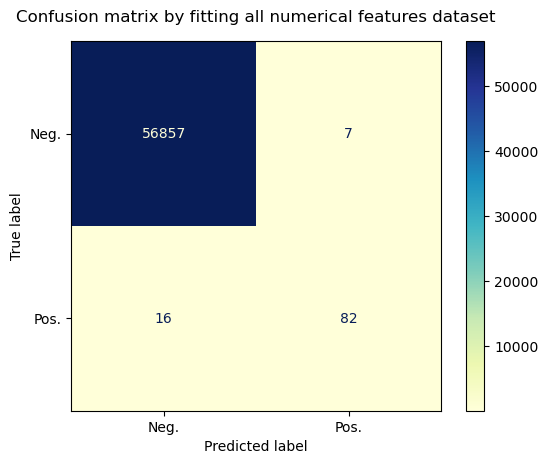

In [96]:
con_matrix(X_test_v, y_test_v, final_model_v, 'all numerical features')

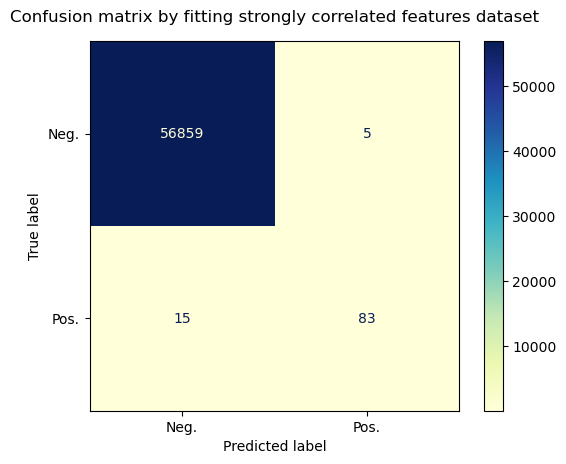

In [109]:
con_matrix(X_test_corr, y_test_corr, final_model_corr, 'strongly correlated features')

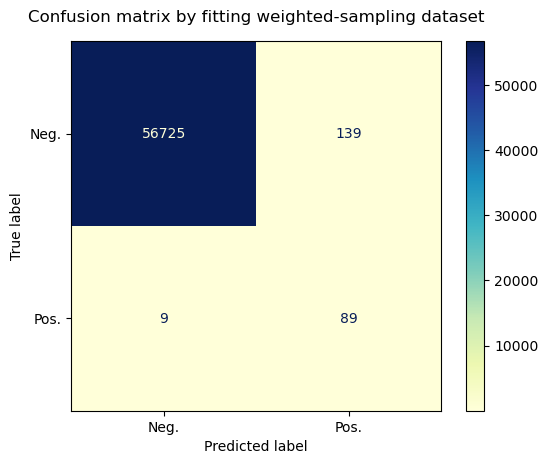

In [98]:
con_matrix(X_test_corr, y_test_corr, final_model_w, 'weighted-sampling')

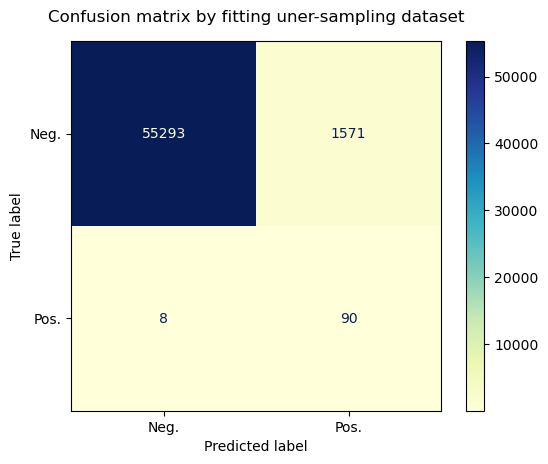

In [99]:
con_matrix(X_test_corr, y_test_corr, final_model_under, 'uner-sampling')

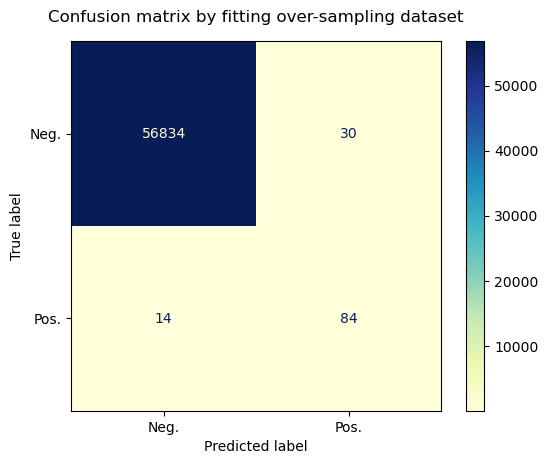

In [100]:
con_matrix(X_test_corr, y_test_corr, final_model_over, 'over-sampling')

## 5.3 Precision recall curve

In this example, the get_recall_at_avg_precision function takes the precision and recall arrays, along with the target average precision value. It finds the index where the precision value is closest to the target average precision and returns the corresponding recall value.

In [101]:
def pr_curve(test_for_pred, y_true, model, model_name):
    
    # Predict class probabilities for test_for_pred
    y_prob = model.predict_proba(test_for_pred)[:, 1]
    # Calculate average precision
    ap = average_precision_score(y_true, y_prob)
    precision, recall, thresholds = precision_recall_curve(y_true, y_prob)
    # Find the optimal pair of recall and precision
    l = []
    for p, r in zip(precision, recall):
        temp = r * p
        l.append(temp)
        
    index_ = l.index(max(l))
    r_ = recall[index_]
    p_ = precision[index_]
    
    plt.figure(figsize=(8, 5))
    # plot avg. precision line
    plt.axhline(
        y=ap, color='r', linestyle='--',
        label='Avg. Precision = {:.3f}'.format(ap)
    )
    plt.scatter(
        r_, p_, c='g', s=40,
        label='Recall = {:.3f}\nPrecision = {:.3f}'.format(r_, p_)
    )
    # plot curve
    plt.plot(recall, precision, color='cornflowerblue', label='Precision recall curve')
    # plot area under curve
    plt.fill_between(recall, precision, color='cornflowerblue', alpha=0.2)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.title(f'Precision recall curve of {model_name}')
    
    # adjust the location of the curve and label
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.legend(loc='lower left')

    plt.show()

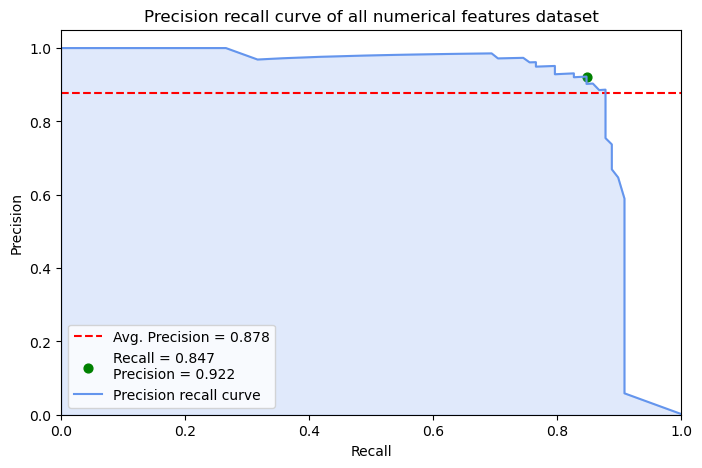

In [102]:
pr_curve(X_test_v, y_test_v, final_model_v, 'all numerical features dataset')

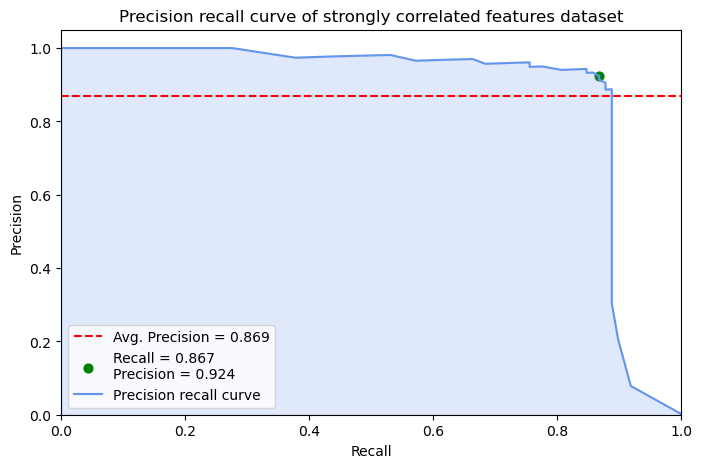

In [110]:
pr_curve(X_test_corr, y_test_corr, final_model_corr, 'strongly correlated features dataset')

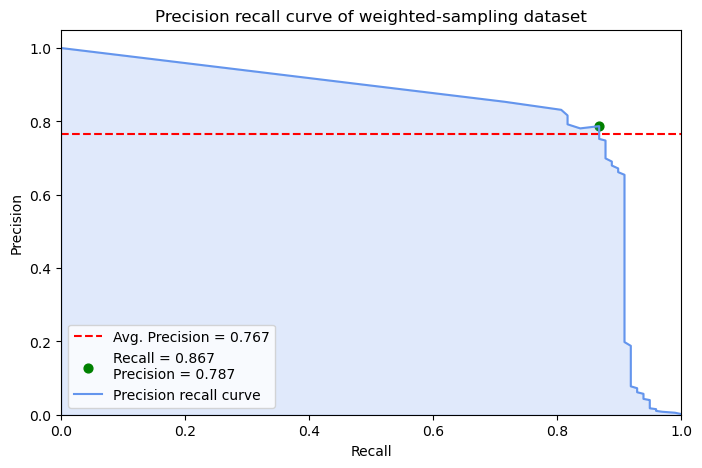

In [104]:
pr_curve(X_test_corr, y_test_corr, final_model_w, 'weighted-sampling dataset')

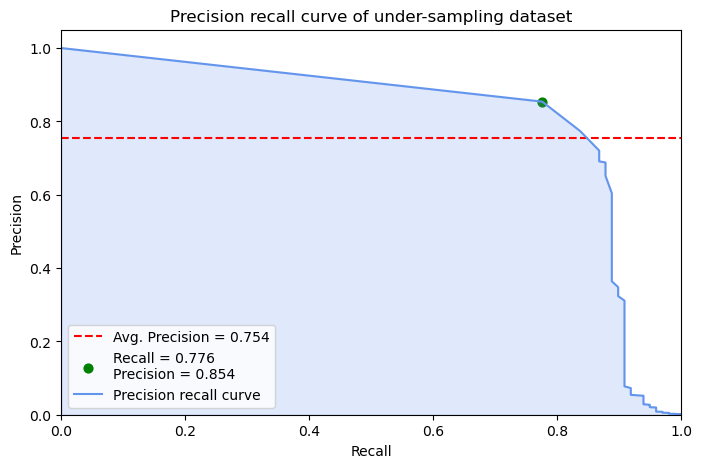

In [105]:
pr_curve(X_test_corr, y_test_corr, final_model_under, 'under-sampling dataset')

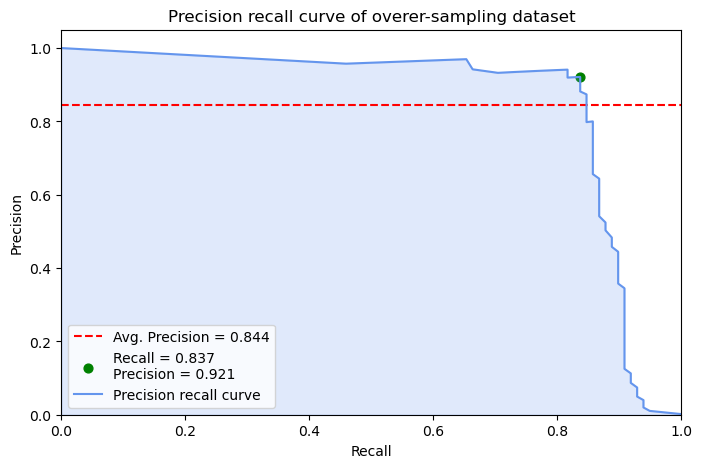

In [106]:
pr_curve(X_test_corr, y_test_corr, final_model_over, 'overer-sampling dataset')